In [179]:
from selenium import webdriver
from bs4 import BeautifulSoup
import requests, os, re

from time import sleep
from time import time
import pandas as pd
import numpy as np

from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer

from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models import Word2Vec
from itertools import combinations 
from sklearn.manifold import TSNE
from bokeh.plotting import figure, show, output_notebook, save
from bokeh.models import HoverTool, value, LabelSet, Legend, ColumnDataSource

In [177]:
headers = {'User-Agent': 'Mozilla/5.0',
           'From': 'itchyandscratchy@gmail.com'
          }

data_path = '/Users/amanda/Documents/Projects/insight/data/'

In [104]:
# Scrape main U of T Programs page to find links to individual program descriptions

base_url = 'https://www.utoronto.ca/academics/programs-directory?field_degrees_value=1&keys={}'
pages = [''] + ['&page={}'.format(i) for i in range(1,15)]

prog_list = []
url_list = []
    
for page in pages:
    
    url = base_url.format(page)
    
    with requests.get(url, timeout=5, headers=headers) as u:     
        soup = BeautifulSoup(u.content) 

        #print(soup.body.prettify())

        # the following is very specific to the website
        for program in soup.findAll('div', attrs={'class':'node-progam-of-study'}):
            prog_url = program.find('a', href=True)
            print(prog_url.get('aria-label'))
            url_list.append(prog_url.get('href'))
            prog_list.append(prog_url.get('aria-label'))
        
programs_df = pd.DataFrame({'link':url_list,'title':prog_list})

programs_df.to_csv(os.path.join(data_path,'processed','uoft_url_list.csv'), index=False)

Accounting in Bachelor of Commerce
Actuarial Science in Honours Bachelor of Science
African Studies in Honours Bachelor of Arts
American Studies in Honours Bachelor of Arts
Animal Physiology in Honours Bachelor of Science
Anthropology in Honours Bachelor of Science | Honours Bachelor of Arts
Anthropology in Honours Bachelor of Arts | Honours Bachelor of Science
Anthropology in Honours Bachelor of Science | Honours Bachelor of Arts
Applied Mathematics in Honours Bachelor of Science
Applied Statistics in Honours Bachelor of Science
Applied Statistics in Honours Bachelor of Science
Archaeology in Honours Bachelor of Arts
Architectural Studies in Honours Bachelor of Arts
Art and Art History (joint program with Sheridan College) in Honours Bachelor of Arts
Art History in Honours Bachelor of Arts
Art History in Honours Bachelor of Arts
Art History and Visual Culture in Honours Bachelor of Arts
Arts Management in Honours Bachelor of Arts
Astronomical Sciences in Honours Bachelor of Science
As

Immunology in Honours Bachelor of Science
Indigenous Studies in Honours Bachelor of Arts
Industrial Engineering in Bachelor of Applied Science
Information Security in Honours Bachelor of Science
Integrative Biology in Honours Bachelor of Science
Interactive Digital Media in Honours Bachelor of Arts
International Affairs in Honours Bachelor of Arts
International Development Studies in Honours Bachelor of Science | Honours Bachelor of Arts
International Relations in Honours Bachelor of Arts
Islamic Studies in Honours Bachelor of Arts
Italian in Honours Bachelor of Arts
Italian in Honours Bachelor of Arts
Jewish Studies in Honours Bachelor of Arts
Journalism (Joint Program with Centennial College) in Honours Bachelor of Arts
Kinesiology in Bachelor of Kinesiology
Language Teaching and Learning: French and Italian in Honours Bachelor of Arts
Lassonde Mineral Engineering in Bachelor of Applied Science
Latin in Honours Bachelor of Arts
Latin American Studies in Honours Bachelor of Arts
Lingu

In [30]:
# Load url_list if not in memory

jobs_df = pd.read_csv(os.path.join(data_path,'processed','uoft_url_list.csv'))

In [140]:
# Scrape websites from the Faculty of Arts and Science to start with since their framework is pretty consistent

courses_df = pd.DataFrame({'link':[],
                           'description':[],
                           'course_names':[],
                           'course_details':[]})

# Here I want the programs in the Faculty of Arts and Science, but not any of the colleges that 
# don't correspond to any one particular program
fas_programs = [s for s in url_list if s.startswith('https://fas.') and not s.endswith('-College')]

for url in fas_programs:
    
    print(url)
    
    with requests.get(url, timeout=5, headers=headers) as u:     
        soup = BeautifulSoup(u.content) 
        
        try:
            # Intro text
            intro = soup.find('div', attrs={'class':'views-field-field-intro'})
            intro_heading = intro.find('h2')

            if intro_heading:
                intro_txt = []
                for sib in intro_heading.next_siblings:
                    if sib.name == 'p':
                        intro_txt.append(sib.text)
                    elif sib.name == 'h2':
                        break

                intro_paragraph = ' '.join(intro_txt)
            else:
                intro_paragraph = 'NaN'

            # List of courses and descriptions
            course_names = []
            course_details = []

            courses_sec = soup.find('div', attrs={'class':'view-courses-view'})

            if courses_sec:   
                for course in courses_sec.findAll('h3'):
                    course_names.append(course.text.strip())
                    course_details.append(course.findNext('p').text.strip())                
            else:
                course_names = 'NaN'
                course_details = 'NaN'

            courses_df = courses_df.append({'link':url,
                                            'description':intro_paragraph,
                                            'course_names':course_names,
                                            'course_details':course_details}, ignore_index=True)
        except:
            continue

courses_df.to_csv(os.path.join(data_path,'processed','program_skills.csv'), index=False)

https://fas.calendar.utoronto.ca/section/Rotman-Commerce
https://fas.calendar.utoronto.ca/section/Actuarial-Science
https://fas.calendar.utoronto.ca/section/American-Studies
https://fas.calendar.utoronto.ca/section/Cell-and-Systems-Biology
https://fas.calendar.utoronto.ca/section/Anthropology
https://fas.calendar.utoronto.ca/section/Mathematics
https://fas.calendar.utoronto.ca/section/Statistical-Sciences
https://fas.calendar.utoronto.ca/section/Archaeology
https://fas.calendar.utoronto.ca/section/Art-History
https://fas.calendar.utoronto.ca/section/Astronomy-and-Astrophysics
https://fas.calendar.utoronto.ca/section/Astronomy-and-Astrophysics
https://fas.calendar.utoronto.ca/section/Biochemistry
https://fas.calendar.utoronto.ca/section/Ecology-and-Evolutionary-Biology
https://fas.calendar.utoronto.ca/section/Philosophy
https://fas.calendar.utoronto.ca/section/Cell-and-Systems-Biology
https://fas.calendar.utoronto.ca/section/Chemistry
https://fas.calendar.utoronto.ca/section/Physics
htt

In [95]:
# Load courses_df if not in memory. Note that saving as csv flattens lists to strings,
# which we may have to deal with later.

courses_df = pd.read_csv(os.path.join(data_path,'processed','program_skills.csv'))

In [141]:
courses_df

,link,description,course_names,course_details
0,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,"[MGT100H1 - Fundamentals of Management, RSM100...",[Introduction to management and its subdiscipl...
1,https://fas.calendar.utoronto.ca/section/Actua...,Actuarial Science is based upon the applicatio...,[ACT199H1 - Decipher Financial Puzzles in the ...,[Have you ever watched a pundit’s passionate r...
2,https://fas.calendar.utoronto.ca/section/Ameri...,The American Studies Program is designed to pr...,"[USA200H1 - Introduction to American Studies, ...",[An interdisciplinary introduction to the stud...
3,https://fas.calendar.utoronto.ca/section/Cell-...,"The study of life, biology, has been transform...","[BIO130H1 - Molecular and Cell Biology, CSB196...",[One of the goals of modern biology is to unde...
4,https://fas.calendar.utoronto.ca/section/Anthr...,Anthropology examines the complexity and diver...,"[ANT100Y1 - Introduction to Anthropology, ANT1...",[Society and culture from various anthropologi...
...,...,...,...,...
98,https://fas.calendar.utoronto.ca/section/Spanish,Overview: Spanish is the most widely spoken la...,"[SPA100Y1 - Spanish for Beginners, SPA120Y1 - ...",[Introduction to the Spanish language for begi...
99,https://fas.calendar.utoronto.ca/section/Stati...,Statistical Science is the science of learning...,[STA130H1 - An Introduction to Statistical Rea...,"[This course, intended for students considerin..."
100,https://fas.calendar.utoronto.ca/section/Stati...,Statistical Science is the science of learning...,[STA130H1 - An Introduction to Statistical Rea...,"[This course, intended for students considerin..."
101,https://fas.calendar.utoronto.ca/section/Chemi...,Chemistry is a challenging intellectual pursui...,[CHM101H1 - The Chemistry and Biology of Organ...,[An introduction to chemistry and chemical pri...


# Make one big table with programs and courses

In [189]:
# I want to join programs_df and courses_df, but first we expand courses_df

program_details = courses_df.explode('course_names')
class_details = courses_df[['course_details']].explode('course_details')

program_details['course_details'] = class_details

# Now we merge with the programs_df dataframe

#merged_programs = pd.merge(left=program_details, right=programs_df, how='left', left_on='link', right_on='link')

merged_programs = pd.merge(left=program_details, right=programs_df, left_on='link', right_on='link')



In [195]:
merged_programs

,link,description,course_names,course_details,title,cleaned_title,cleaned_name
0,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,MGT100H1 - Fundamentals of Management,Introduction to management and its subdiscipli...,Accounting in Bachelor of Commerce,Accounting,Fundamentals of Management
1,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,MGT100H1 - Fundamentals of Management,Introduction to management and its subdiscipli...,Finance and Economics in Bachelor of Commerce,Finance and Economics,Fundamentals of Management
2,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,MGT100H1 - Fundamentals of Management,Introduction to management and its subdiscipli...,Management in Bachelor of Commerce,Management,Fundamentals of Management
3,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,RSM100H1 - Introduction to Management,Introduction to management and its subdiscipli...,Accounting in Bachelor of Commerce,Accounting,Introduction to Management
4,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,RSM100H1 - Introduction to Management,Introduction to management and its subdiscipli...,Finance and Economics in Bachelor of Commerce,Finance and Economics,Introduction to Management
5,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,RSM100H1 - Introduction to Management,Introduction to management and its subdiscipli...,Management in Bachelor of Commerce,Management,Introduction to Management
6,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,MGT201H1 - Introduction to Financial Accounting,Introduction to financial reporting and analys...,Accounting in Bachelor of Commerce,Accounting,Introduction to Financial Accounting
7,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,MGT201H1 - Introduction to Financial Accounting,Introduction to financial reporting and analys...,Finance and Economics in Bachelor of Commerce,Finance and Economics,Introduction to Financial Accounting
8,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,MGT201H1 - Introduction to Financial Accounting,Introduction to financial reporting and analys...,Management in Bachelor of Commerce,Management,Introduction to Financial Accounting
9,https://fas.calendar.utoronto.ca/section/Rotma...,Rotman Commerce at the University of Toronto o...,RSM210H1 - Special Topics in Management,Topics and Issues in Management. Content in an...,Accounting in Bachelor of Commerce,Accounting,Special Topics in Management


In [196]:
# Clean dataframe
course_names = [s.split(' - ')[-1] for s in merged_programs['course_names']]
merged_programs['cleaned_name'] = course_names

description_df = merged_programs.drop_duplicates(subset=['cleaned_name','course_details']) 

In [ ]:
# Clean dataframe
program_titles = [s.split(' in ')[0] for s in programs_df['title']]

programs_df['cleaned_title'] = program_titles

merged_programs = pd.merge(left=programs_df, right=program_details[['link','description']], how='right', left_on='link', right_on='link')

In [147]:
description_df = merged_programs.drop_duplicates(subset=['cleaned_title','description']) 

# Skills analysis from notebook 05

In [197]:
def preprocess(text):
    """ preprocess text: remove special characters, remove digits, tokenize,
    lowercase, remove stopwords, lemmatize
    """
    # preparing for text preprocessing: tokenizer, stopwords, and lemmatizer
    tokenizer = RegexpTokenizer(r'\w+')
    stopwords_en = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    text = re.sub('[^a-zA-Z]', ' ', text )
    text = re.sub(r'\s+', ' ', text)
    tokens = tokenizer.tokenize(text)
    tokens = [token.lower() for token in tokens if len(token)>1]
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stopwords_en]
    return ' '.join(tokens)

In [201]:
# preprocess job title and description
for col in ['cleaned_name','course_details']:
    description_df[col] = description_df[col].str.strip('in Canada')
    description_df[col] = description_df[col].astype(str)
    description_df[col+'_processed'] = description_df[col].apply(preprocess)

# have a column for both title and descritpion
cols = ['cleaned_name_processed','course_details_processed']
description_df['title_and_desc'] = description_df[cols].apply(lambda x: ' '.join(x), axis=1)

/Users/amanda/.virtualenvs/insight/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/amanda/.virtualenvs/insight/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/Users/amanda/.virtualenvs/insight/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is tr

In [204]:
def plot_common_words(df, column, n):
    """plot n most common words in a column of a df"""
    fdist = Counter(' '.join(row for row in df[column]).split()).most_common(n) # freq distribution of n most common words
    word = [i[0] for i in fdist]
    count = [i[1] for i in fdist]
    word_pos = [i for i, _ in enumerate(word)]
    
    plt.figure(figsize=(8, 6))
    plt.barh(word_pos, count)
    plt.yticks(word_pos, word)
    plt.ylabel('word')
    plt.xlabel('count')
    plt.title('Frequency of'+' '+str(n)+' '+'most common words in {}'.format(column))
    plt.gca().invert_yaxis() # invert y axis to descending order
    plt.show()

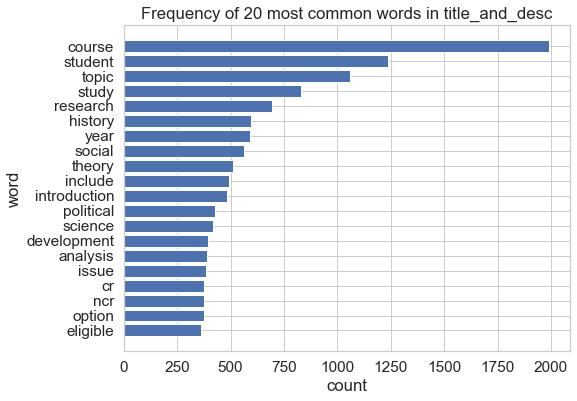

In [205]:
# plot most common words in job titles
sns.set(style='whitegrid', font_scale=1.4)
plot_common_words(description_df, 'title_and_desc', 20)

In [207]:
# vectorize job description - for work_exp df
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=5000)
job_description_vec = vectorizer.fit_transform(description_df['course_details_processed'])

In [208]:
def multiple_nmf(kmin, kmax, vec_text):
    """run multiple nmf models with a chosen range of number of components,
    return a list XXXXX
    
    kmin -- minimum number of topics
    kmax -- maximum number of topics
    vec_text -- vectorized text
    """
    topic_models = []
    for k in range(kmin, kmax+1):
        print("Applying NMF for k=%d ..." % k)
        nmf = NMF(n_components=k,
                  init="nndsvd",
                  alpha=0.1,
                  random_state=42) 
        W = nmf.fit_transform(vec_text)
        H = nmf.components_    
        topic_models.append((k, nmf, W, H))
    
    return topic_models

In [209]:
topic_models = multiple_nmf(10, 20, job_description_vec)

Applying NMF for k=10 ...
Applying NMF for k=11 ...
Applying NMF for k=12 ...
Applying NMF for k=13 ...
Applying NMF for k=14 ...
Applying NMF for k=15 ...
Applying NMF for k=16 ...
Applying NMF for k=17 ...
Applying NMF for k=18 ...


/Users/amanda/.virtualenvs/insight/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1077: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


Applying NMF for k=19 ...
Applying NMF for k=20 ...


/Users/amanda/.virtualenvs/insight/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1077: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


In [211]:
# convert job_description_processed to a list of lists for word2vec model
job_desc_train = description_df['course_details_processed'].apply(lambda x: x.split(' ')).tolist()

# train word2vec model
word2vec_model = Word2Vec(job_desc_train,
                          size=200,
                          window=8,
                          min_count=5,
                          workers=4)
word2vec_model.train(job_desc_train, total_examples=len(job_desc_train), epochs=10)

(751940, 925860)

In [212]:
# have a look at the word2vec results
word2vec_model.wv.most_similar(positive='program')

[('intended', 0.9409907460212708),
 ('specialist', 0.9321812391281128),
 ('enrolled', 0.8678434491157532),
 ('recommended', 0.8581679463386536),
 ('specializing', 0.8571842908859253),
 ('fourth', 0.8567463159561157),
 ('amount', 0.8418805003166199),
 ('open', 0.838971734046936),
 ('pharmaceutical', 0.8364945650100708),
 ('biochemistry', 0.8310062885284424)]

In [213]:
def get_top_terms(vectorizer, H, n_top_terms):
    """get terms most important for each of the topics of an nmf model
    return a dictionary with topic number as key and a list of top terms as values
    
    vectorizer -- vectorizer for text
    H -- topic term matrix from nmf model
    n_top_terms -- number of top words to choose
    """
    terms = vectorizer.get_feature_names()
    
    top_terms_dict = {};
    # for each topic, get the largest weights, and save the corresponding words into the dictionary
    num_topics = H.shape[0]
    for i in range(num_topics):
        ids = H[i].argsort()[-n_top_terms:] 
        # word_ids is ordered such that largest weight is the last item, reverse it to have it as first item
        top_terms_dict['Topic '+'{:01d}'.format(i+1)] = [terms[id] for id in reversed(ids)]
        
    return top_terms_dict

def compute_coherence(word2vec_model, top_terms_dict):
    """compute coherence score, ie, mean pairwise similarity of top terms
    
    word2vec_model -- word2vec model trained on words in dataset
    top_term_dict -- top words of each topic (output of get_top_terms() function)
    """
    overall_coherence = 0.0
    num_topics = len(top_terms_dict)
    for i in range(num_topics):
        pair_scores = []
        # compute similarity score for each pair of top words in each topic
        for pair in combinations(top_terms_dict['Topic '+'{:01d}'.format(i+1)], 2):
            pair_scores.append(word2vec_model.wv.similarity(pair[0], pair[1]))
        
        topic_score = sum(pair_scores)/len(pair_scores)
        overall_coherence += topic_score
    
    # get mean score across topics
    return overall_coherence/num_topics

def compare_coherence(topic_models, vectorizer, n_top_terms, word2vec_model):
    """get topic coherence for multiple nmf models
    
    topic_models -- output of multiple_nmf() function
    """
    coherence_dict = {}
    for i in range(len(topic_models)):
        top_terms_dict = get_top_terms(vectorizer, topic_models[i][3], n_top_terms) # 4th element of each list in topic_models: H     
        
        k = topic_models[i][0] # first element of each list in topic models: k
        coherence = compute_coherence(word2vec_model, top_terms_dict)
        print("K=%02d: Coherence=%.4f" % (k, coherence))
        coherence_dict[k] = coherence
        
    return coherence_dict

In [214]:
# get top words for each of 20 topics
best_k = 20
top_words = pd.DataFrame(get_top_terms(vectorizer, topic_models[best_k-10][3], 15))
W = topic_models[best_k-10][2]

In [215]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [216]:
# have a look at top words in each of the 20 topics
top_words

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,Topic 17,Topic 18,Topic 19,Topic 20
0,social,year,eligible,advanced,lab,designed,depends,language,rotman,french,film,data,history,music,specialist,policy,human,science,work,art
1,political,vary,option,philosophy,material,italian,instructor,grammar,commerce,ca,cinema,analysis,th,ability,research,economic,health,scientific,text,architecture
2,gender,topic,faculty,topic,chemistry,enhance,content,skill,contact,http,include,method,century,read,limited,market,disease,student,literary,abroad
3,cultural,upper,ncr,study,fee,component,given,portuguese,detail,utoronto,medium,statistical,development,required,student,financial,genetic,theory,literature,study
4,course,seminar,cr,law,cell,includes,year,speaking,option,www,special,design,survey,prior,major,international,genetics,theorem,poetry,visual
5,sexuality,level,member,religion,molecular,experience,depth,vocabulary,ncr,see,past,model,modern,background,psy,theory,nature,physic,fiction,monument
6,examines,subject,research,discussion,laboratory,course,examination,spanish,cr,undergraduate,topic,introduction,world,musical,priority,public,population,problem,writing,theme
7,politics,depending,project,moral,biology,student,issue,linguistics,eligible,information,study,application,present,popular,enrolment,include,animal,course,reading,artist
8,culture,explore,independent,figure,system,research,politics,written,management,specific,genre,inference,war,context,program,government,behaviour,life,study,examination
9,religious,offered,supervised,specialized,biological,english,website,writing,student,current,american,regression,period,survey,capacity,relation,environmental,equation,genre,painting
